In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg # para leer imagenes
import matplotlib.patches as patches # para agregar un bounding box

import numpy as np
from keras_cv import visualization

## Funciones y constantes

In [9]:
img_path = "/kaggle/input/cat-faces-detection/result-dataset/result-dataset/data/"

In [16]:
# codigo de chatgpt para ver a varios gatos
def see_cats(data):
    # Randomly choose 25 indices from your dataset
    random_indices = np.random.choice(len(data), size=25, replace=False)

    num_rows = 5
    num_cols = 5
    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

    # Iterate through the randomly chosen indices and plot each cat
    for i, idx in enumerate(random_indices, 1):
        # Get the cat information using the randomly chosen index
        cat = data.iloc[idx]

        # Read the image
        img = mpimg.imread(img_path + cat.image)

        # Calculate subplot index
        row_idx = (i - 1) // num_cols
        col_idx = (i - 1) % num_cols

        # Plot the image
        axes[row_idx, col_idx].imshow(img)
        axes[row_idx, col_idx].axis('off')

        # Add bounding box
        rect = patches.Rectangle((cat.x, cat.y), cat.width, cat.height, linewidth=2, edgecolor='r', facecolor='none')
        axes[row_idx, col_idx].add_patch(rect)
        axes[row_idx, col_idx].text(0.95, 0.95, f"{cat.origin} - {str(round(cat.score,2))}" , horizontalalignment='right', verticalalignment='top', transform=axes[row_idx, col_idx].transAxes)


    # Adjust layout
    plt.tight_layout()
    plt.show()

## Ver los datos

In [10]:
data = pd.read_csv('/kaggle/input/cat-faces-detection/info.csv')

In [6]:
data.head()

,x,y,width,height,rotation,origin,score,image
0,122.230813,59.530609,201.038635,183.601630,0.0,prediction-changed,0.160966,CAT_CAT_00-00000001_000.jpg
1,28.241333,0.073227,244.227875,178.675186,0.0,prediction,0.235929,CAT_CAT_00-00000001_005.jpg
2,297.306152,178.445610,72.131531,62.688248,0.0,prediction,0.392774,CAT_CAT_00-00000001_008.jpg
3,99.820144,16.636691,267.535971,249.550360,0.0,manual,NaN,CAT_CAT_00-00000001_011.jpg
4,86.943573,5.539001,196.731659,191.392136,0.0,prediction,0.172511,CAT_CAT_00-00000001_012.jpg


In [11]:
def see_cat_box(cat):
    print(cat)
    img = mpimg.imread(img_path + cat.image)
    plt.imshow(img)
    rect = patches.Rectangle((cat.x,cat.y), cat.width, cat.height, linewidth = 2, edgecolor = 'r', facecolor='none')
    # Add the rectangle to the plot
    plt.gca().add_patch(rect)
    # Show the plot
    plt.show()

x                            122.230813
y                             59.530609
width                        201.038635
height                        183.60163
rotation                            0.0
origin               prediction-changed
score                          0.160966
image       CAT_CAT_00-00000001_000.jpg
Name: 0, dtype: object


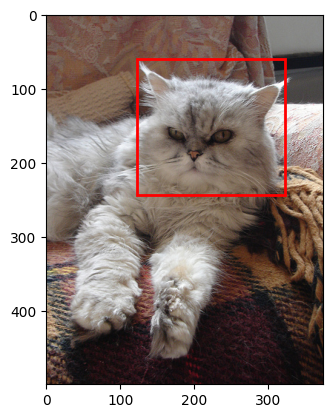

In [12]:
cat = data.iloc[0]
see_cat_box(cat)

In [17]:
cat.y + cat.height 

243.13223957646574

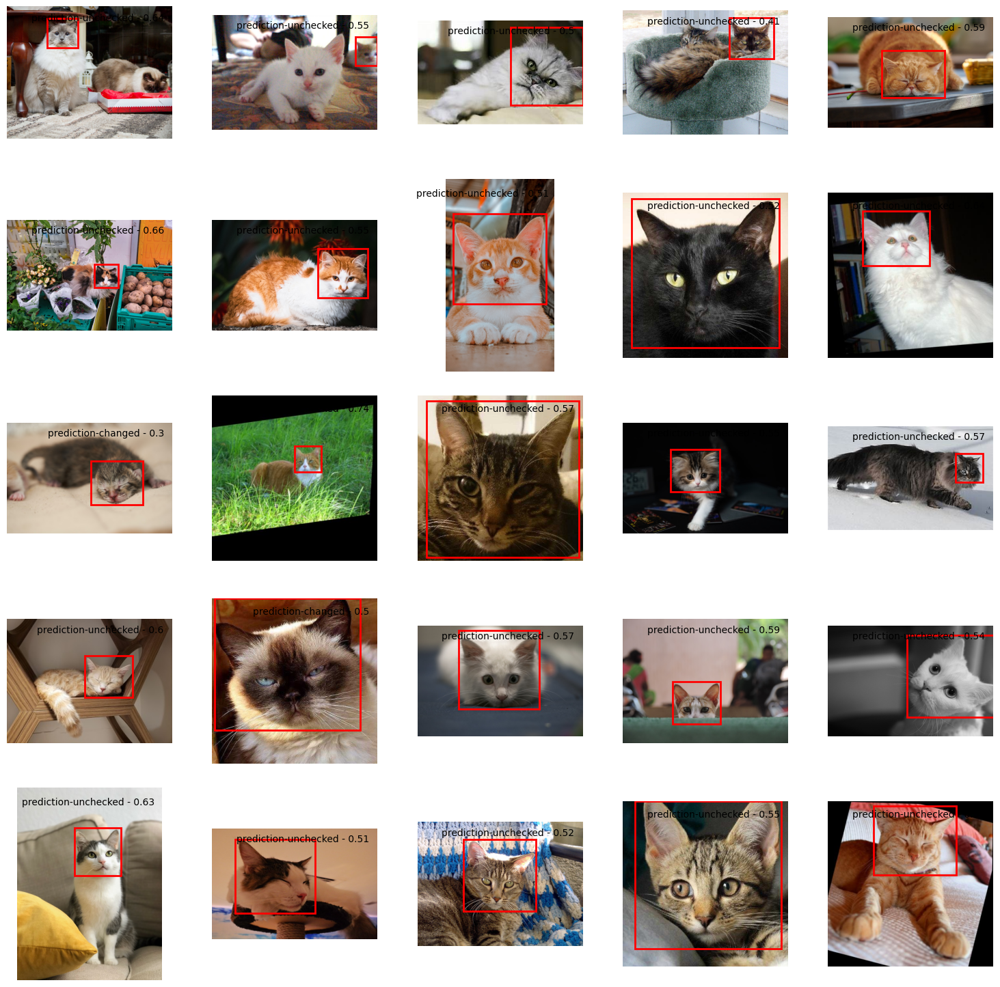

In [10]:
see_cats(data)

In [11]:
# Hay imagenes que son de la prediccion del modelo de esta gente
# las que dicen prediction-unchecked son las que predijo el modelo y no han revisado
data.groupby('origin').size()

origin
manual                    318
prediction                880
prediction-changed        883
prediction-unchecked    50318
dtype: int64

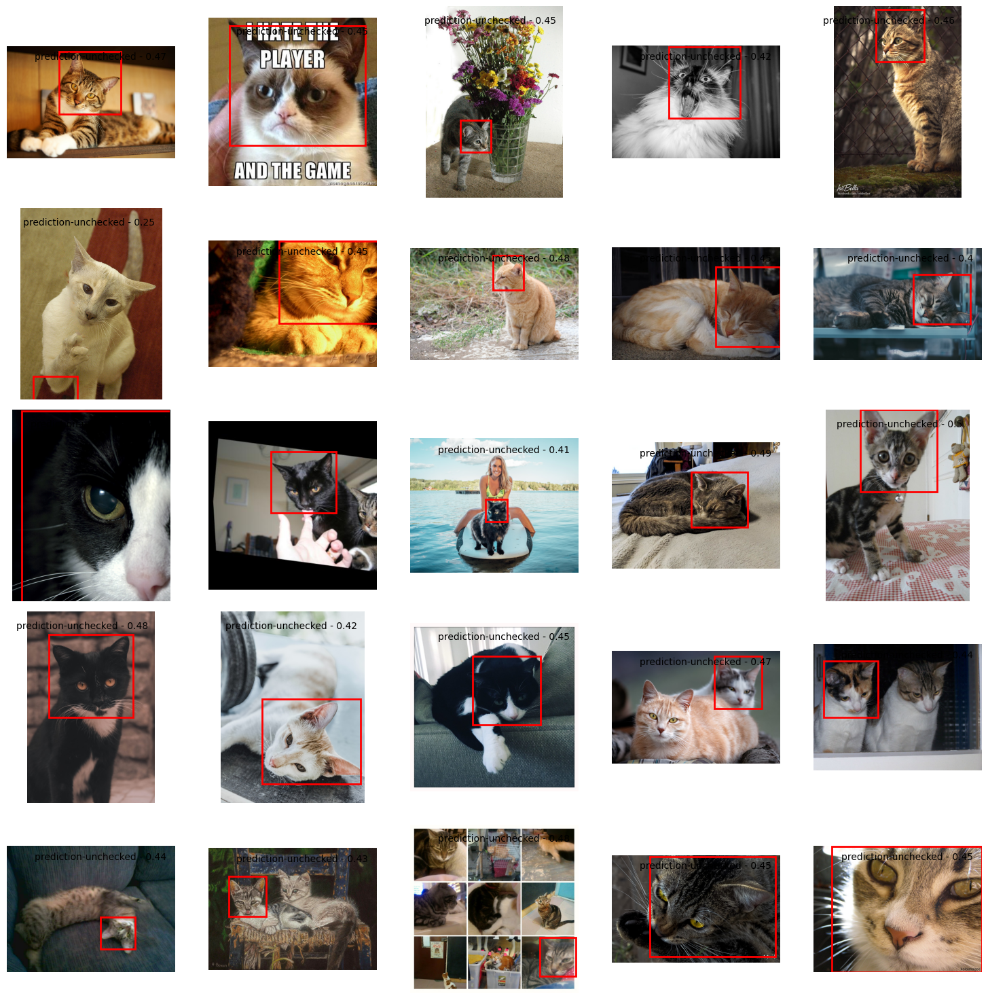

In [13]:
see_cats(data[(data.origin == "prediction-unchecked") & (data.score < 0.50)])

In [8]:
# Me voy a quedar solo con los que ellos comprobaron
datasure = data[data.origin != 'prediction-unchecked']

In [9]:
datasure.groupby('origin').size()

origin
manual                318
prediction            880
prediction-changed    883
dtype: int64

In [16]:
datasure.shape

(2081, 8)

## Modelo

In [3]:
!pip install keras_cv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 4.5 MB/s eta 0:00:00a 0:00:01m


## Probando con modelo YOLO sin cmabiarle nada

In [1]:
import keras_cv
import tensorflow as tf

2024-05-26 02:41:58.427065: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-26 02:41:58.427169: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-26 02:41:58.573866: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# codigo de chatgpt que todavia no entiendo :p
# Load the pretrained YOLOV8 backbone
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(preset ="yolo_v8_m_pascalvoc", bounding_box_format="xywh")

Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_m_pascalvoc/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_m_pascalvoc/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/yolov8/keras/yolo_v8_m_pascalvoc/2' to your Kaggle notebook...


x                            115.064504
y                            114.324346
width                        146.618276
height                       149.525197
rotation                            0.0
origin               prediction-changed
score                          0.254377
image       CAT_CAT_00-00000012_025.jpg
Name: 100, dtype: object


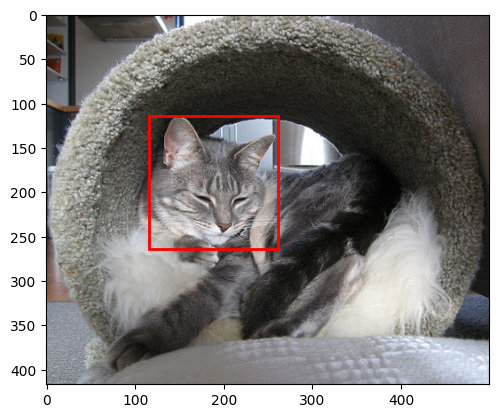

In [13]:
see_cat_box(data.iloc[100])

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step


I0000 00:00:1716691529.576007     109 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


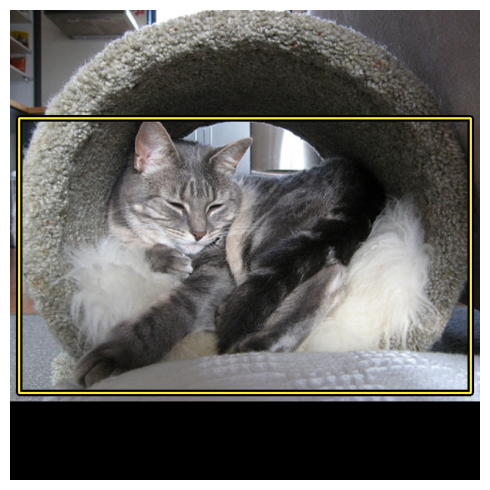

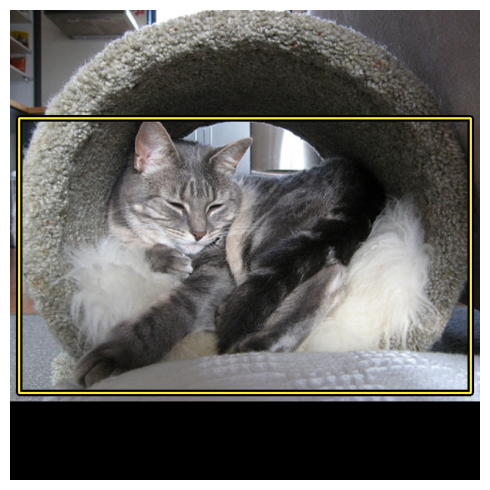

In [14]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([mpimg.imread(img_path + data.iloc[100].image)])
y_pred = pretrained_model.predict(image_batch)

visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh"
)

In [ ]:
img_resize = image_batch[0]
img_resize = np.array(img_resize).astype(np.uint8)
plt.imshow(img_resize)
rect = patches.Rectangle((dim[0],dim[1]), dim[2], dim[3], linewidth = 2, edgecolor = 'r', facecolor='none')
# Show the plot
plt.gca().add_patch(rect)
plt.show()

## Implementando YOLO

### Arreglando los datos en el formato que recibe YOLO
https://www.kaggle.com/code/stpeteishii/cat-face-images-for-yolo

Voy a hacer lo que hicieron en ese notebook, que es arreglar los datos que ya vienen del dataset. 

In [11]:
import os
import random
import shutil
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import keras

In [25]:
print(len(datasure))
files=datasure['image'].unique().tolist()
print(len(files))

2081
2020


In [26]:
#So, overall, this code removes duplicate entries from the DataFrame data based on the 'image' column.
#It identifies duplicates by checking if there are multiple rows associated with the same image and removes them from the DataFrame.

DROP=[]
for file in files:
    datai=datasure[datasure['image']==file]
    if len(datai)>1:
         DROP+=datai.index.tolist()
print(DROP)
datasure2=datasure.drop(DROP,axis=0).reset_index(drop=True)

[83, 84, 95, 96, 188, 189, 190, 514, 515, 529, 530, 542, 543, 557, 558, 559, 569, 570, 601, 602, 608, 609, 796, 797, 841, 842, 843, 864, 865, 1050, 1051, 1056, 1057, 1102, 1103, 1130, 1131, 1302, 1303, 1320, 1321, 1322, 1352, 1353, 1354, 1651, 1652, 1767, 1768, 1898, 1899, 1976, 1977, 2205, 2206, 2985, 2986, 3124, 3125, 3517, 3518, 4099, 4100, 4172, 4173, 4346, 4347, 4408, 4409, 5679, 5680, 6225, 6226, 7857, 7858, 8131, 8132, 11968, 11969, 12082, 12083, 12725, 12726, 12980, 12981, 13276, 13277, 13571, 13572, 13573, 13574, 14649, 14650, 15154, 15155, 15171, 15172, 15173, 15222, 15223, 15224, 15225, 15813, 15814, 15815, 40208, 40209, 48404, 48405, 48652, 48653]


In [27]:
print(len(datasure2))

1970


In [28]:
#Preprocesando los datos para poder meterlos a yolo
for i in range(len(datasure2)):
    file=datasure2.loc[i,'image']
    path=os.path.join(img_path,file)
    img=cv2.imread(path)
    (H,W,_)=img.shape
    datasure2.loc[i,'H']=H
    datasure2.loc[i,'W']=W   
    datasure2.loc[i,'label']=0
    #datasure2.loc[i,'Xcent']=(datasure2.loc[i,'x']+datasure2.loc[i,'width']/2)/W
    #datasure2.loc[i,'Ycent']=(datasure2.loc[i,'y']+datasure2.loc[i,'height']/2)/H
    #datasure2.loc[i,'boxW']=datasure2.loc[i,'width']/W
    #datasure2.loc[i,'boxH']=datasure2.loc[i,'height']/H
    #print(i)

In [29]:
datasure2.head()

,x,y,width,height,rotation,origin,score,image,H,W,label
0,122.230813,59.530609,201.038635,183.601630,0.0,prediction-changed,0.160966,CAT_CAT_00-00000001_000.jpg,500.0,375.0,0.0
1,28.241333,0.073227,244.227875,178.675186,0.0,prediction,0.235929,CAT_CAT_00-00000001_005.jpg,375.0,500.0,0.0
2,297.306152,178.445610,72.131531,62.688248,0.0,prediction,0.392774,CAT_CAT_00-00000001_008.jpg,375.0,500.0,0.0
3,99.820144,16.636691,267.535971,249.550360,0.0,manual,NaN,CAT_CAT_00-00000001_011.jpg,375.0,500.0,0.0
4,86.943573,5.539001,196.731659,191.392136,0.0,prediction,0.172511,CAT_CAT_00-00000001_012.jpg,333.0,500.0,0.0


In [30]:
bbox = []
images_path = []
classes = []
for i in range(len(datasure2)):
    cat = datasure2.iloc[i]
    bbox.append([[cat.x, cat.y, cat.width, cat.height ]])
    images_path.append(img_path + cat.image)
    # creo que esa es la clase del gato en coco dataset (?)
    classes.append([0])


In [ ]:
# Esto es si se  tienen multiples boxes y clases por imagenes y pueden variar para cada imagen
# me retracto al parecer sin esto no funciona porque el preentrenado lo esta espernado
#bbox = tf.ragged.constant(bbox)
#classes = tf.ragged.constant(classes)
#images_path = tf.ragged.constant(images_path)

In [31]:
datatensor = tf.data.Dataset.from_tensor_slices((images_path, classes, bbox))

In [74]:
# Dividir en datasets de train y validacion
SPLIT_RATIO = 0.2
num_val = int(len(datatensor) * SPLIT_RATIO)

# Split the dataset into train and validation sets
val_data = datatensor.take(num_val)
train_data = datatensor.skip(num_val)

def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image

def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    #bbox = tf.expand_dims(bbox, axis=0)
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox,
    }
    #return {"images": tf.cast(image, tf.float32)}, {"classes":tf.cast(classes, dtype=tf.float32)}, {"bounding_boxes":bbox}
    #return {"images":  tf.expand_dims(tf.cast(image, tf.float32), axis=0), "bounding_boxes": bounding_boxes}        
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}

# el autotune tiene que ver con el trabajo de la CPU
train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)

In [33]:
train_ds

<_ParallelMapDataset element_spec={'images': TensorSpec(shape=(None, None, 3), dtype=tf.float32, name=None), 'bounding_boxes': {'classes': TensorSpec(shape=(1,), dtype=tf.float32, name=None), 'boxes': TensorSpec(shape=(1, 4), dtype=tf.float64, name=None)}}>

In [75]:
BATCH_SIZE = 8

augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
        keras_cv.layers.RandomShear(
            x_factor=0.2, y_factor=0.2, bounding_box_format="xywh"
        ),
       keras_cv.layers.Resizing(
            640,
            640,
            interpolation="bilinear",
            crop_to_aspect_ratio=False,
            pad_to_aspect_ratio=True,
            bounding_box_format="xywh"
        )
    ]
)

# Para train se hace augmentation
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)


resizing =  keras_cv.layers.Resizing(
            640,
            640,
            interpolation="bilinear",
            crop_to_aspect_ratio=False,
            pad_to_aspect_ratio=True,
            bounding_box_format="xywh"
        )

# Para validacion no se usa augmentation
# revolver los datos
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
# crear batches
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
# resize de los datos para entrar a la YOLO
val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)
        
print(f"Datos de entrenamiento: {len(train_ds) * BATCH_SIZE}")
print(f"Datos de validacion: {len(val_ds)* BATCH_SIZE}")

Datos de entrenamiento: 1576
Datos de validacion: 392


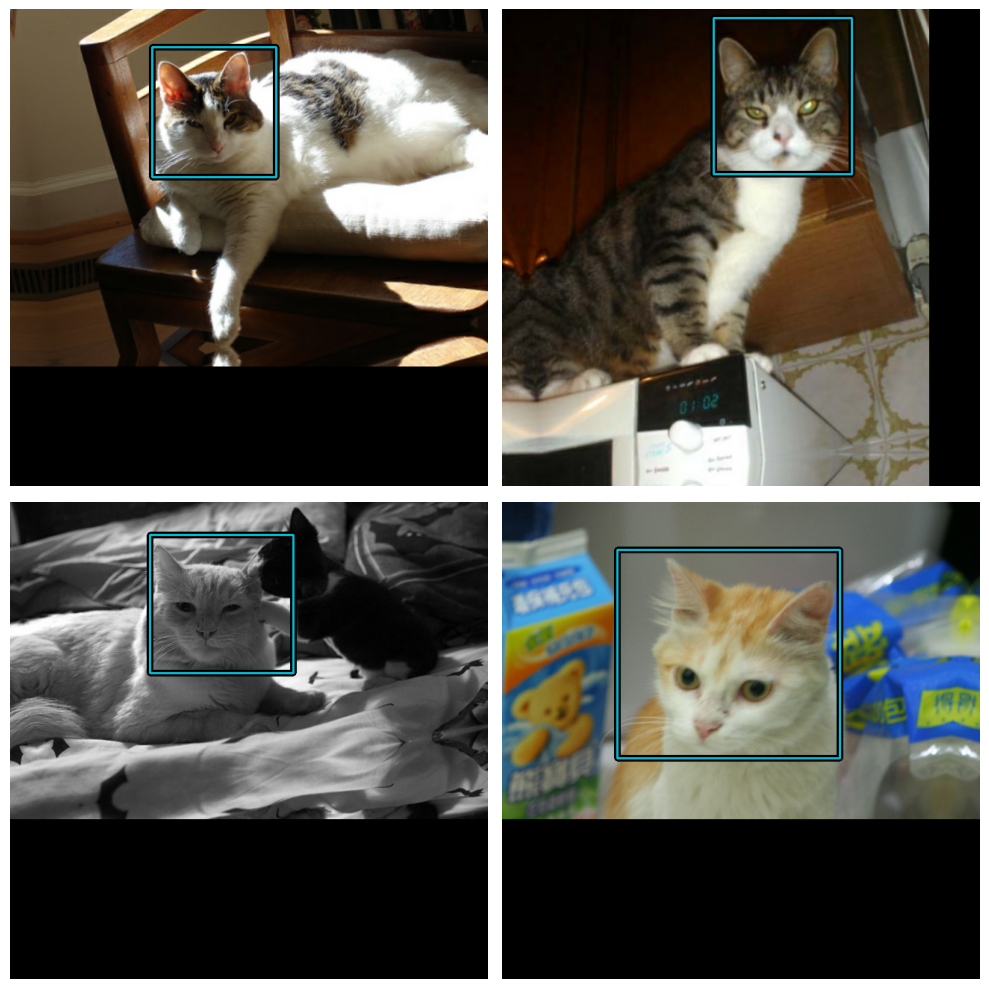

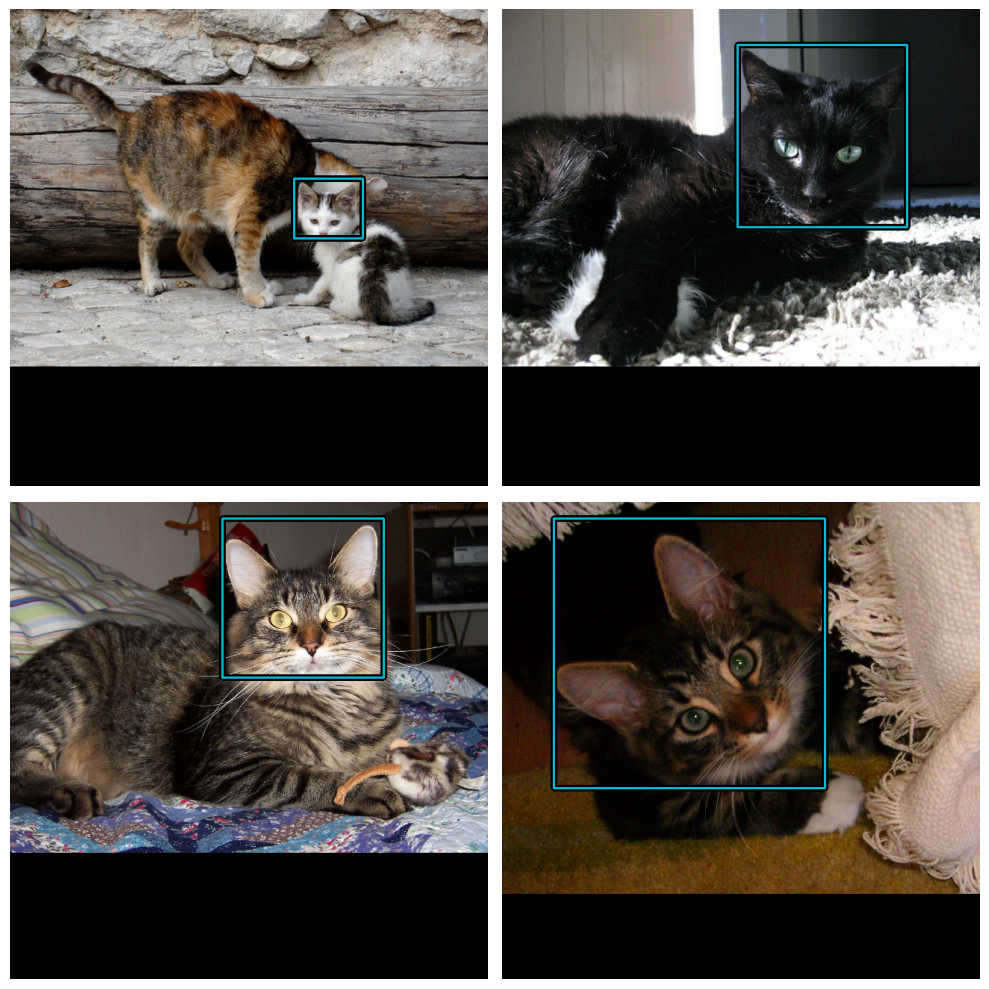

In [41]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format
    )


visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

visualize_dataset(
    val_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

In [76]:
# Por el problema de ragged tensor durante el entrenamiento convierto los datos en tensor normales
# Esto lo puedo hacer porque por cada imagen hay solo un bouding box por gato :3
def dataToTensor(data):
    image = data["images"]
    bounding_boxes = data["bounding_boxes"]
    
    tensor_bounding_boxes = bounding_boxes.copy()  # Create a copy to avoid modifying the original dictionary
    tensor_bounding_boxes["boxes"] = bounding_boxes["boxes"].to_tensor()
    tensor_bounding_boxes["classes"] = bounding_boxes["classes"].to_tensor()
    
    return {"images": image, "bounding_boxes": tensor_bounding_boxes}


train_ds = train_ds.map(dataToTensor, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(dataToTensor, num_parallel_calls=tf.data.AUTOTUNE)

In [77]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

### Mi modelo YOLO wuuu

In [44]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(preset ="yolo_v8_s_backbone_coco")

Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_s_backbone_coco/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_s_backbone_coco/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/yolov8/keras/yolo_v8_s_backbone_coco/2' to your Kaggle notebook...


In [ ]:
backbone.summary()

In [78]:
yolo = keras_cv.models.YOLOV8Detector(
    num_classes=1,
    bounding_box_format="xywh",
    backbone=backbone,
    fpn_depth=1
)

base_lr = 0.002
# including a global_clipnorm is extremely important in object detection tasks
optimizer = tf.keras.optimizers.Adam(
    learning_rate=base_lr, global_clipnorm=10.0
)

# ciou es un sabor de la intersaction over union loss
yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou")

In [ ]:
yolo.summary()

In [79]:
import tensorflow as tf
import numpy as np

class EvaluateBoundingBoxesCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset):
        super(EvaluateBoundingBoxesCallback, self).__init__()
        self.dataset = dataset

    def on_epoch_end(self, epoch, logs=None):
        avg_iou, avg_accuracy = self.evaluate_metrics()
        print(f"\nAverage IoU on validation set after epoch {epoch + 1}: {avg_iou:.4f}")
        print(f"Average accuracy on validation set after epoch {epoch + 1}: {avg_accuracy:.4f}")

    def evaluate_metrics(self):
        total_iou = 0.0
        total_accuracy = 0.0
        total_samples = 0

        for images, y_true in self.dataset:
            y_pred = self.model.predict(images)
            iou, accuracy = self.calculate_metrics(y_true, y_pred)
            total_iou += np.sum(iou)
            total_accuracy += np.sum(accuracy)
            total_samples += images.shape[0]

        avg_iou = total_iou / total_samples
        avg_accuracy = total_accuracy / total_samples
        return avg_iou, avg_accuracy

    def calculate_metrics(self, y_true, y_pred):
        # Calculate intersection over union (IoU) for bounding boxes
        iou = self.calculate_iou(y_true['boxes'], y_pred['boxes'])

        # Calculate accuracy for class prediction
        accuracy = self.calculate_accuracy(y_true['classes'], y_pred['classes'])

        return iou, accuracy

    def calculate_iou(self, y_true, y_pred):
        # Calculate IoU as before
        true_boxes = y_true
        pred_boxes = y_pred

        # Compute box areas
        true_area = true_boxes[..., 2] * true_boxes[..., 3]
        pred_area = pred_boxes[..., 2] * pred_boxes[..., 3]

        # Compute intersection coordinates
        x1 = np.maximum(true_boxes[..., 0] - true_boxes[..., 2] / 2, pred_boxes[..., 0] - pred_boxes[..., 2] / 2)
        y1 = np.maximum(true_boxes[..., 1] - true_boxes[..., 3] / 2, pred_boxes[..., 1] - pred_boxes[..., 3] / 2)
        x2 = np.minimum(true_boxes[..., 0] + true_boxes[..., 2] / 2, pred_boxes[..., 0] + pred_boxes[..., 2] / 2)
        y2 = np.minimum(true_boxes[..., 1] + true_boxes[..., 3] / 2, pred_boxes[..., 1] + pred_boxes[..., 3] / 2)

        # Compute intersection area
        intersection_area = np.maximum(x2 - x1, 0) * np.maximum(y2 - y1, 0)

        # Compute union area
        union_area = true_area + pred_area - intersection_area

        # Compute IoU
        iou = intersection_area / (union_area + 1e-8)  # Adding epsilon to avoid division by zero

        return iou

    def calculate_accuracy(self, y_true, y_pred):
        # Calculate accuracy for class prediction
        accuracy = np.mean(np.equal(np.argmax(y_true, axis=-1), np.argmax(y_pred, axis=-1)))
        return accuracy


In [ ]:
yolo.load_weights("/kaggle/working/first_training.weights.h5")

In [ ]:
# Assume model is your Keras model
num_layers = len(yolo.layers)
print("Number of layers in the model:", num_layers)


In [372]:
# Assume model is your Keras model

# First, identify the index of the layer from which you want to start freezing.
# You can use model.summary() to see the layer indices.

# For example, if you want to freeze the first 10 layers:
freeze_index = 80

# Then, iterate over the layers and set the `trainable` attribute to False for the desired layers:
for layer in yolo.layers[:freeze_index]:
    layer.trainable = False

# Compile the model after freezing the layers
yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)


In [ ]:
yolo.summary()

In [80]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
tf.config.run_functions_eagerly(True)
early_stopping = EarlyStopping(patience=5, restore_best_weights = True)

history = yolo.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[EvaluateBoundingBoxesCallback(val_ds), early_stopping],
    verbose = True
)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/stepstep - loss: 123.066
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/st

In [81]:
# Extract elements using a for loop
for images, y_true in val_ds.take(1):
    print(y_true)
    y_pred = yolo.predict(images)
    print(y_pred)
    pass

{'boxes': <tf.Tensor: shape=(8, 1, 4), dtype=float32, numpy=
array([[[ 83.1525   ,  76.42742  , 296.80075  , 311.621    ]],

       [[127.76978  ,  21.294964 , 342.4461   , 319.42447  ]],

       [[196.15662  ,  90.31674  , 116.92462  , 122.714294 ]],

       [[315.07257  ,  49.681335 , 227.19434  , 243.38315  ]],

       [[111.28777  ,   7.0859294, 251.8165   , 244.844    ]],

       [[327.5113   ,   1.7266188, 272.25458  , 271.80585  ]],

       [[177.63634  , 147.95667  , 123.84749  , 108.40756  ]],

       [[185.50851  ,  60.994762 , 286.94662  , 287.78058  ]]],
      dtype=float32)>, 'classes': <tf.Tensor: shape=(8, 1), dtype=float32, numpy=
array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)>}
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
{'boxes': array([[[ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
   

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


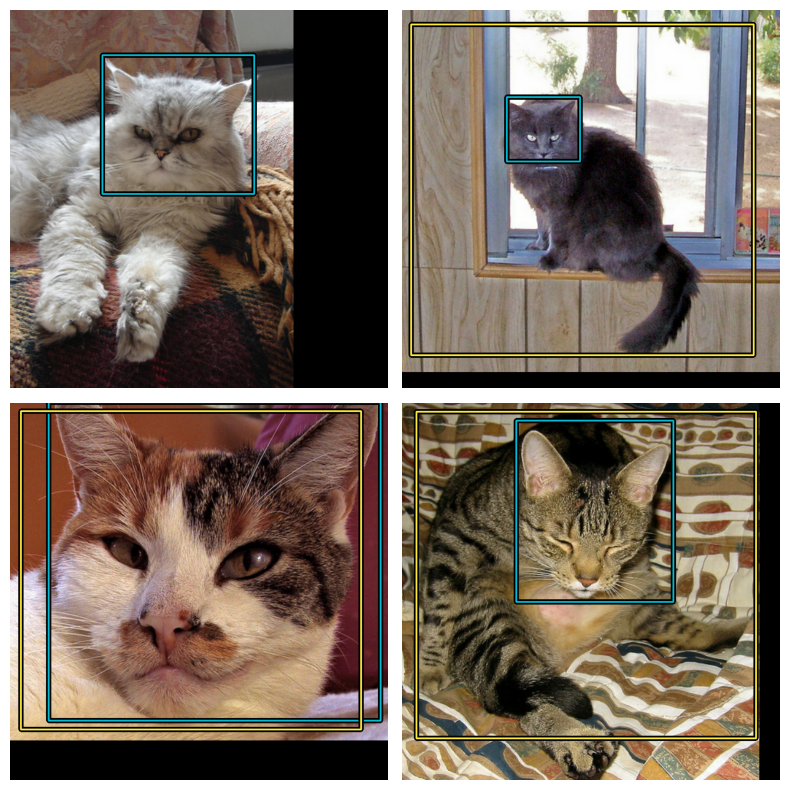

In [87]:
def visualize_detections(model, dataset, bounding_box_format, class_mapping):
    for images, y_true in dataset.take(1):  # Iterate over the dataset
        y_pred = model.predict(images)
        # Create ragged tensor if necessary
        # Example: y_pred = tf.ragged.constant(y_pred)
        visualization.plot_bounding_box_gallery(
            images,
            value_range=(0, 255),
            bounding_box_format=bounding_box_format,
            y_true=y_true,
            y_pred=y_pred,
            scale=4,
            rows=2,
            cols=2,
            show=True,
            font_scale=0.7,
            class_mapping=class_mapping,
        )

# Example usage
visualize_detections(yolo, dataset=val_ds, bounding_box_format="xywh", class_mapping=[{0: "cat"}])


In [ ]:
yolo.save_weights('first_training.weights.h5')

# Implementación de YOLO v8 con Ultralystic

## Preporcesar imagenes

Mover a carpetas de validation y train

In [ ]:
# Codigo para eliminar carpeta por si me equivoco
folder_path = 'wandb'
# Delete the folder and its contents
#shutil.rmtree(folder_path)

**Mover imagenes de training y validacion a carpetas por separado**

In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os
import shutil

# Load your dataset (replace 'your_dataset.csv' with the actual file name)
df = datasure

# Define the test size (e.g., 20% of the data for validation)
test_size = 0.2

# Split the dataset
train_df, val_df = train_test_split(df, test_size=test_size, random_state=42)

# Define the directories
train_dir = 'train/images'
val_dir = 'val/images'

# Create directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Function to move images
def move_images(image_paths, destination_dir):
    for image_path in image_paths:
        # Define the destination path
        dest_path = os.path.join(destination_dir, os.path.basename(image_path))
        # Move the image
        shutil.copy(img_path + image_path, dest_path)

# Move training images
move_images(train_df['image'].tolist(), train_dir)

# Move validation images
move_images(val_df['image'].tolist(), val_dir)

**Crear archivo data.yaml**

In [11]:
from PIL import Image

# Create directories for YOLO labels
os.makedirs('train/labels', exist_ok=True)
os.makedirs('val/labels', exist_ok=True)

# Function to convert annotations to YOLO format
def convert_to_yolo_format(row, img_width, img_height):
    x_center = (row['x'] + row['width'] / 2) / img_width
    y_center = (row['y'] + row['height'] / 2) / img_height
    width = row['width'] / img_width
    height = row['height'] / img_height
    return f"0 {x_center} {y_center} {width} {height}"

# Iterate over the dataframe and create .txt files
def create_yolo_txt_files(df, images_dir):
    for _, row in df.iterrows():
        image_path = row['image']
        image_name = os.path.basename(image_path)
        txt_file_path = os.path.join(images_dir, 'labels', f"{os.path.splitext(image_name)[0]}.txt")
        
        # Get image dimensions
        with Image.open(img_path + image_path) as img:
            img_width, img_height = img.size
            
        yolo_annotation = convert_to_yolo_format(row, img_width, img_height)
        
        with open(txt_file_path, 'w') as f:
            f.write(yolo_annotation)

# Apply the function to create YOLO txt files for train and val sets
create_yolo_txt_files(train_df, 'train')
create_yolo_txt_files(val_df, 'val')

In [12]:
import yaml
# Create data.yaml file
data = {
    'train': os.path.abspath('train'),
    'val': os.path.abspath('val'),
    'nc': 1,
    'names': ['cat']
}

with open('data.yaml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

**Modelo con Ultralystic**

In [ ]:
!pip install ultralytics

In [54]:
from ultralytics import YOLO
# Load a model
model = YOLO("yolov8n.yaml").load("yolov8n.pt")  # build from YAML and transfer weights

# Train the model con mis datos!
results = model.train(data="data.yaml", epochs=100, imgsz=640, patience=20)

Transferred 355/355 items from pretrained weights
Ultralytics YOLOv8.2.21 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=100, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labe

wandb: Currently logged in as: pauzca (pauzca15). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/train/labels.cache... 1621 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1621/1621 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.41G      1.034      1.744       1.32         11        640: 100%|██████████| 102/102 [00:23<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.17it/s]

                   all        415        415      0.801      0.689      0.767      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.31G      1.051      1.247      1.322          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.24it/s]

                   all        415        415      0.641      0.665      0.617      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       2.3G      1.103      1.141       1.35         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.856      0.795      0.861      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.29G      1.095      1.048      1.346          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.22it/s]

                   all        415        415      0.805      0.698      0.779      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       2.3G      1.038     0.9586      1.304         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.26it/s]

                   all        415        415      0.866      0.891      0.905       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.29G     0.9994     0.8624      1.275          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.42it/s]

                   all        415        415      0.915      0.826      0.916      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       2.3G     0.9765     0.8335      1.262         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.20it/s]

                   all        415        415      0.915      0.843      0.905      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.29G      0.949     0.7975      1.241         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.43it/s]

                   all        415        415      0.888      0.858      0.926      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       2.3G     0.9328     0.7527      1.225         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.09it/s]

                   all        415        415      0.891      0.908      0.924      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.29G     0.9276     0.7568      1.219         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.38it/s]

                   all        415        415      0.923      0.908      0.948      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       2.3G     0.9168     0.7264      1.213         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.29it/s]

                   all        415        415      0.911      0.819      0.911      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.29G     0.8987     0.7053      1.206         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.41it/s]

                   all        415        415      0.914      0.921      0.957      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.3G     0.8898     0.6779        1.2         15        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.27it/s]

                   all        415        415      0.929      0.906      0.955       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.29G     0.8823     0.6789      1.187         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.64it/s]

                   all        415        415      0.907      0.947      0.957      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       2.3G     0.8457     0.6479      1.169          9        640: 100%|██████████| 102/102 [00:21<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.97it/s]

                   all        415        415      0.927      0.953      0.965      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.29G     0.8703     0.6457      1.174         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.36it/s]

                   all        415        415      0.938      0.949       0.97      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       2.3G     0.8427     0.6373      1.167         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]

                   all        415        415      0.925      0.935      0.944      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.29G     0.8438     0.6299      1.164         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.32it/s]

                   all        415        415      0.933      0.925      0.949      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       2.3G     0.8187     0.6168      1.145          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.22it/s]

                   all        415        415      0.929      0.937      0.949      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.29G     0.8249     0.5967      1.161         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]

                   all        415        415      0.924      0.923      0.954      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.3G     0.8212     0.5942       1.16         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.12it/s]

                   all        415        415      0.929      0.954      0.964      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.29G     0.8326     0.5857      1.152         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.47it/s]

                   all        415        415      0.948       0.92      0.951      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       2.3G     0.8072     0.5838       1.14         15        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.32it/s]

                   all        415        415      0.916      0.947       0.96      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.29G      0.815     0.5731      1.147         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]

                   all        415        415       0.92      0.928      0.951      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.3G     0.7951     0.5635      1.134          6        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.32it/s]

                   all        415        415      0.926      0.961      0.962      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.29G     0.7847      0.547      1.126          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.50it/s]

                   all        415        415      0.944      0.927      0.961      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.3G     0.7835     0.5552      1.124          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.38it/s]

                   all        415        415      0.922      0.945      0.965      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.29G     0.7741     0.5394      1.123         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]

                   all        415        415      0.918      0.964       0.97        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       2.3G     0.7959     0.5625      1.134          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        415        415      0.939      0.964      0.969      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.29G     0.7619     0.5351      1.115         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.934      0.961      0.968      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       2.3G     0.7647     0.5275      1.115         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        415        415      0.945      0.949      0.966      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.29G     0.7552     0.5225      1.105         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        415        415      0.947      0.951      0.962      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       2.3G      0.769     0.5158      1.111          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.84it/s]

                   all        415        415      0.938      0.957      0.957      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.29G     0.7567     0.5134       1.11         16        640: 100%|██████████| 102/102 [00:22<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.95it/s]

                   all        415        415      0.933      0.969      0.967      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       2.3G     0.7497     0.5115      1.101         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.23it/s]

                   all        415        415      0.936      0.958      0.961      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.29G     0.7498     0.5103      1.107          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        415        415      0.924      0.967      0.969      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       2.3G     0.7445     0.4865      1.097         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.22it/s]

                   all        415        415       0.94      0.948      0.969      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.29G     0.7312     0.4953      1.107         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.42it/s]

                   all        415        415      0.942      0.971      0.973      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       2.3G     0.7389     0.4995      1.097         18        640: 100%|██████████| 102/102 [00:22<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.941      0.963      0.956      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.29G      0.742     0.5055      1.103          6        640: 100%|██████████| 102/102 [00:21<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.91it/s]

                   all        415        415      0.932      0.964      0.967      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       2.3G     0.7338     0.4787      1.091          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.25it/s]

                   all        415        415       0.95      0.961      0.971      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.29G     0.7178      0.477      1.086         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.22it/s]

                   all        415        415      0.934      0.962      0.975       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       2.3G      0.725     0.4816      1.096          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.47it/s]

                   all        415        415      0.929      0.966      0.959      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.29G     0.7372     0.4787      1.099         17        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.16it/s]

                   all        415        415      0.933      0.969      0.959      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       2.3G     0.7196     0.4746      1.086         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.929      0.972      0.966      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.29G     0.6956     0.4552      1.073         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.26it/s]

                   all        415        415      0.931      0.978      0.967      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       2.3G     0.7109     0.4594       1.08         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.07it/s]

                   all        415        415      0.954      0.964      0.964      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.29G     0.7083     0.4538       1.08         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.47it/s]

                   all        415        415      0.939      0.969      0.954      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       2.3G     0.6936     0.4449      1.065         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.46it/s]

                   all        415        415      0.944      0.954      0.961      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.29G     0.6875     0.4519      1.071          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.52it/s]

                   all        415        415      0.928      0.971      0.963      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       2.3G     0.6855     0.4433      1.074         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.36it/s]

                   all        415        415      0.948      0.945      0.965       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.29G     0.6717     0.4298      1.062          7        640: 100%|██████████| 102/102 [00:22<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.59it/s]

                   all        415        415      0.946      0.962      0.962      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       2.3G     0.6809     0.4364      1.065         11        640: 100%|██████████| 102/102 [00:21<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.05it/s]

                   all        415        415       0.94      0.961      0.963      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.29G     0.6712      0.434      1.062         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        415        415      0.941      0.966      0.965       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       2.3G     0.6807     0.4436      1.066         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.34it/s]

                   all        415        415      0.948      0.969      0.965       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.29G     0.6676     0.4316      1.055         15        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]

                   all        415        415      0.952       0.95      0.968       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       2.3G     0.6688     0.4299      1.056          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.57it/s]

                   all        415        415      0.945      0.952      0.963       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.29G     0.6675     0.4326      1.063         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.30it/s]

                   all        415        415      0.948      0.959      0.969      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       2.3G     0.6614     0.4157      1.047         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.98it/s]

                   all        415        415       0.95      0.973      0.965      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.29G     0.6606     0.4263      1.053          7        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.21it/s]

                   all        415        415      0.948      0.963      0.957      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       2.3G     0.6568     0.4126      1.045         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all        415        415      0.946      0.966      0.961      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.29G     0.6522     0.4115      1.049         13        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        415        415      0.942      0.964      0.971      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       2.3G     0.6491     0.4048      1.044         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.45it/s]

                   all        415        415      0.939       0.97      0.972      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.29G     0.6606     0.4189      1.054         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.52it/s]

                   all        415        415      0.939      0.963      0.969      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       2.3G     0.6389     0.4076      1.039         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.26it/s]

                   all        415        415      0.953      0.957       0.96      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.29G     0.6492     0.4062       1.05          5        640: 100%|██████████| 102/102 [00:22<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.62it/s]

                   all        415        415      0.931      0.973      0.967      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       2.3G       0.64     0.4009      1.038          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.33it/s]

                   all        415        415      0.946      0.966       0.97      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.29G     0.6439     0.4041      1.047         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.933      0.968      0.964      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       2.3G     0.6248     0.3856      1.034         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.949      0.954       0.97      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.29G     0.6307     0.3871      1.033         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.54it/s]

                   all        415        415      0.948      0.965      0.971      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       2.3G     0.6107      0.381      1.031          5        640: 100%|██████████| 102/102 [00:22<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.41it/s]

                   all        415        415      0.936      0.971      0.962      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.29G     0.6317      0.384      1.038          7        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]

                   all        415        415      0.943      0.964      0.966      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       2.3G     0.6166     0.3898      1.029          7        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]

                   all        415        415      0.941      0.978      0.961      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.29G     0.6129     0.3775      1.029         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.37it/s]

                   all        415        415      0.945       0.96      0.968      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       2.3G     0.6141      0.376      1.033         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.50it/s]

                   all        415        415      0.948      0.965      0.964      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.29G      0.604     0.3739      1.022          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]

                   all        415        415      0.944      0.961      0.958      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.3G     0.6121     0.3812      1.027          8        640: 100%|██████████| 102/102 [00:22<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.30it/s]

                   all        415        415      0.942      0.961      0.965      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.29G        0.6     0.3718      1.021          9        640: 100%|██████████| 102/102 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.01it/s]

                   all        415        415      0.945      0.957      0.966      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       2.3G     0.5901     0.3732      1.014         10        640: 100%|██████████| 102/102 [00:21<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.65it/s]

                   all        415        415      0.946      0.966      0.966      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.29G     0.5942      0.369      1.017         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.41it/s]

                   all        415        415       0.95      0.953      0.966      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       2.3G     0.5928     0.3664      1.022         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        415        415      0.948      0.969      0.971      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.29G     0.5831     0.3541      1.014         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.36it/s]

                   all        415        415      0.948      0.965       0.96      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       2.3G     0.5894     0.3607      1.017         10        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all        415        415      0.949      0.954      0.967       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.29G     0.5846      0.354       1.01          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.17it/s]

                   all        415        415      0.943      0.964      0.958      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       2.3G     0.5722     0.3505     0.9998         12        640: 100%|██████████| 102/102 [00:22<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.23it/s]

                   all        415        415      0.948       0.96      0.964      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.29G     0.5804     0.3542      1.009         12        640: 100%|██████████| 102/102 [00:21<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.57it/s]

                   all        415        415       0.95      0.956      0.967      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       2.3G     0.5647     0.3404      1.002         11        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.42it/s]

                   all        415        415      0.952      0.963      0.962       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.29G     0.5678     0.3479      1.003         15        640: 100%|██████████| 102/102 [00:22<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.49it/s]

                   all        415        415      0.955      0.957      0.964      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       2.3G     0.5702     0.3504      1.002          9        640: 100%|██████████| 102/102 [00:22<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.27it/s]

                   all        415        415      0.953      0.957      0.965      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.29G      0.551     0.3323     0.9979         14        640: 100%|██████████| 102/102 [00:22<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]

                   all        415        415      0.951      0.957      0.954      0.823


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       2.3G     0.4558     0.2546     0.9368          5        640: 100%|██████████| 102/102 [00:22<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.95it/s]

                   all        415        415      0.953      0.954      0.961      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.29G     0.4518     0.2399     0.9298          5        640: 100%|██████████| 102/102 [00:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        415        415      0.948      0.966      0.965       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       2.3G     0.4497     0.2319     0.9273          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.54it/s]

                   all        415        415       0.95      0.967      0.966      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.29G     0.4409     0.2347     0.9189          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.56it/s]

                   all        415        415      0.959      0.954      0.964      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       2.3G     0.4348     0.2282     0.9228          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.54it/s]

                   all        415        415      0.946      0.966       0.96      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.29G     0.4313     0.2246     0.9177          5        640: 100%|██████████| 102/102 [00:20<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.97it/s]

                   all        415        415      0.952       0.96      0.963      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       2.3G     0.4268     0.2235     0.9131          5        640: 100%|██████████| 102/102 [00:20<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.49it/s]

                   all        415        415      0.952      0.957      0.961       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.29G     0.4233     0.2194     0.9154          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.77it/s]

                   all        415        415      0.958      0.954      0.968       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       2.3G     0.4189     0.2186     0.9098          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.46it/s]

                   all        415        415      0.947      0.969      0.967      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.29G     0.4191     0.2155     0.9114          5        640: 100%|██████████| 102/102 [00:21<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.61it/s]

                   all        415        415      0.948      0.968      0.966      0.839



100 epochs completed in 0.749 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 6.2MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics YOLOv8.2.21 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.00it/s]


                   all        415        415      0.958      0.954      0.968      0.841
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train5


lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▄▆▆▆▇█▇███████▇████████████████████████
metrics/mAP50-95(B),▁▃▄▅▅▆▇▆▇▇▇▇▇▇▇▇▇▇██████████████████████
metrics/precision(B),▁▃▆▅▆▇▇▇▇▆▇▆▇▇▆▇█▇▇▇█▇██▇▇▇█▇▇▇▇█▇██████
metrics/recall(B),▁▄▄▅▄▆▇▇▇▇▇█▇██████▇▇█▇████▇███████▇█▇▇▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇█▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▃▁▁▁▁


**Probando el modelo**

In [132]:
# Load a model (si no lo estoy entrenando)
model = YOLO("/kaggle/working/runs/detect/train5/weights/best.pt") 

x                            498.901001
y                             91.148387
width                        297.290323
height                       290.535484
rotation                            0.0
origin                           manual
score                               NaN
image       CAT_CAT_02-00000595_018.jpg
Name: 4226, dtype: object


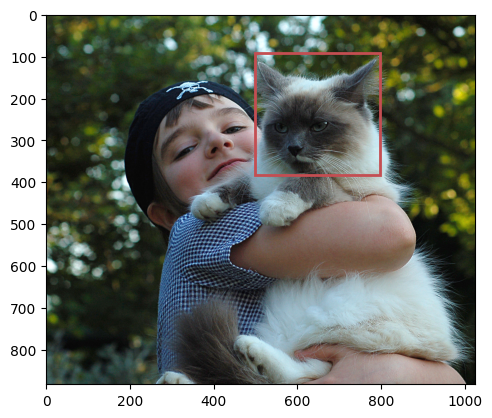

In [133]:
cat = val_df.iloc[0]
see_cat_box(cat)

In [134]:
# Define path to the image file
source = img_path + cat.image

# Run inference on the source
results = model.predict(source, save=True)


image 1/1 /kaggle/input/cat-faces-detection/result-dataset/result-dataset/data/CAT_CAT_02-00000595_018.jpg: 576x640 1 cat, 8.3ms
Speed: 3.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 576, 640)
Results saved to runs/detect/predict


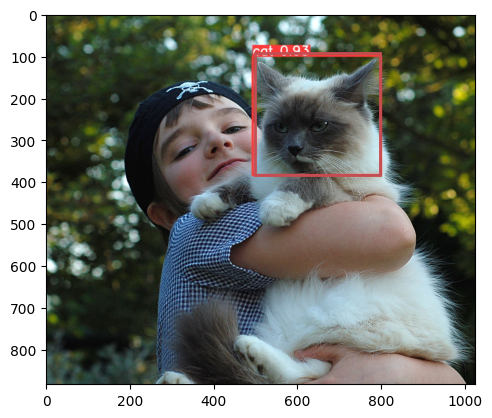

In [135]:
img = mpimg.imread("/kaggle/working/runs/detect/train52/" + cat.image)
plt.imshow(img)
rect = patches.Rectangle((cat.x,cat.y), cat.width, cat.height, linewidth = 2, edgecolor = 'r', facecolor='none')
# Add the rectangle to the plot
plt.gca().add_patch(rect)
# Show the plot
plt.show()

In [143]:
## Mostrando multiples imagenes
# Define path to the image file
cats = val_df.sample(n=20, random_state=9)
sources = cats['image']
sources = sources.apply(lambda x: img_path + x ).tolist()

# Run inference on the source
results = model.predict(sources, save = True)  # list of Results objects


0: 640x640 1 cat, 4.6ms
1: 640x640 1 cat, 4.6ms
2: 640x640 (no detections), 4.6ms
3: 640x640 1 cat, 4.6ms
4: 640x640 1 cat, 4.6ms
5: 640x640 1 cat, 4.6ms
6: 640x640 2 cats, 4.6ms
7: 640x640 1 cat, 4.6ms
8: 640x640 1 cat, 4.6ms
9: 640x640 1 cat, 4.6ms
10: 640x640 1 cat, 4.6ms
11: 640x640 1 cat, 4.6ms
12: 640x640 1 cat, 4.6ms
13: 640x640 1 cat, 4.6ms
14: 640x640 1 cat, 4.6ms
15: 640x640 1 cat, 4.6ms
16: 640x640 1 cat, 4.6ms
17: 640x640 1 cat, 4.6ms
18: 640x640 1 cat, 4.6ms
19: 640x640 1 cat, 4.6ms
Speed: 2.2ms preprocess, 4.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


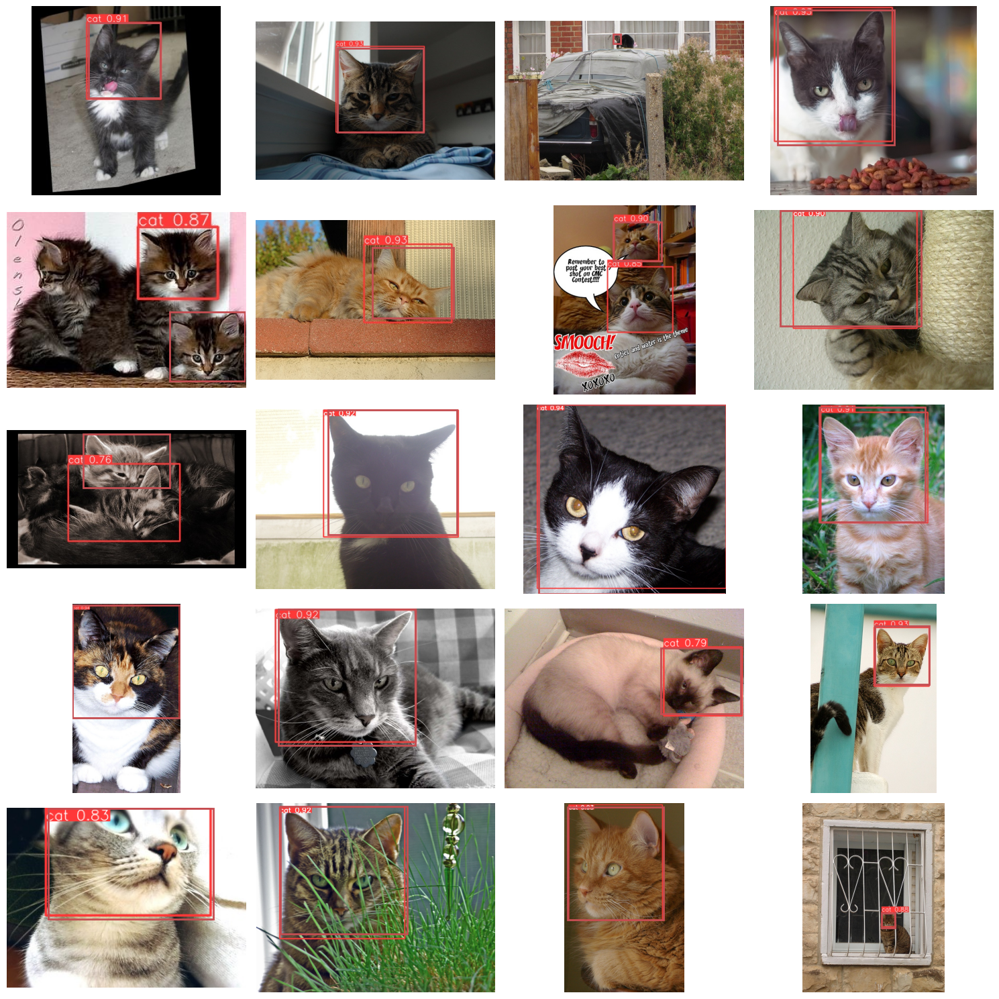

In [144]:
prediction_dir = "/kaggle/working/runs/detect/predict/"

# Create a figure and axes for the grid
fig, axes = plt.subplots(5, 4, figsize=(15, 15))
# Flatten the axes array for easy iteration
axes = axes.flatten()

for i in range(len(cats)):
    cat = cats.iloc[i]
    img_pred = mpimg.imread(prediction_dir + cat.image)
    ax = axes[i]
    ax.imshow(img_pred)
    rect = patches.Rectangle((cat.x,cat.y), cat.width, cat.height, linewidth = 2, edgecolor = 'r', facecolor='none')
    ax.add_patch(rect)     # Add the rectangle to the plot
    ax.axis("off")
    
plt.tight_layout()
plt.show()

**Exportar el modelo**

In [105]:
model.export()

Ultralytics YOLOv8.2.21 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train5/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)

TorchScript: starting export with torch 2.1.2...
TorchScript: export success ✅ 2.2s, saved as 'runs/detect/train5/weights/best.torchscript' (11.9 MB)

Export complete (3.7s)
Results saved to /kaggle/working/runs/detect/train5/weights
Predict:         yolo predict task=detect model=runs/detect/train5/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train5/weights/best.torchscript imgsz=640 data=data.yaml  
Visualize:       https://netron.app


'runs/detect/train5/weights/best.torchscript'